In [1]:
%runfile H3.py

In [2]:
from utils import (make_M_alphas, 
                   make_poly_from_edges, 
                   poly_equiv, tri0, tri1, tri2, cycle_poly, std_poly,
                   poly_gl2_orbit_reps, 
                   aas_triangle_gl2_orbit_reps, 
                   square_parameters, 
                   aaa_triangle_parameters, 
                   aas_triangle_parameters,
                   hexagon_parameters)

In [3]:
kdata = make_k(-24)
k = kdata['k']
w = kdata['w']
zero = k(0)
one = k(1)
Ireps = kdata['Ireps']
inf = cusp(infinity, k)

In [4]:
alphas = precomputed_alphas(k)
M_alphas, alpha_inv = make_M_alphas(alphas)

assert alphas == [cusp(zero), cusp((w+1)/2), cusp(5/(2*w)), cusp(-5/(2*w))]

sigmas = singular_points_new(k)
assert sigmas == [inf, cusp(w/2)]


In [5]:
polys = all_polyhedra(k)
polys = sum(polys,[])
print("{} polyhedra constructed".format(len(polys)))

New orbit from P_0=[-2/5*w - 1/10, 3/100]: {0, 1, 2, 3}
New orbit from P_4=[-1/3*w + 1/2, 1/12]: {4}
New orbit from P_5=[1/3*w + 1/2, 1/12]: {5}
Found [[5], [0, 1, 2, 3], [4]] orbits:
Constructed 3 polyhedra
Faces: [[6, 6, 3, 6, 3, 3, 6, 3], [6, 4, 4, 4, 6, 4, 4, 4], [6, 6, 3, 6, 3, 3, 6, 3]]
New orbit from R_0=[4/7*w - 1/14, 1/28]: {0, 1, 2, 3}
Found 1 orbits with representative points [[0, 1, 2, 3]]:
Constructed 1 polyhedra
Faces: [[3, 3, 4, 3, 3]]
4 polyhedra constructed


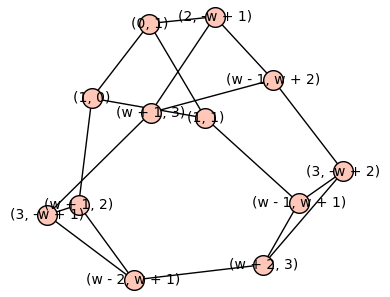

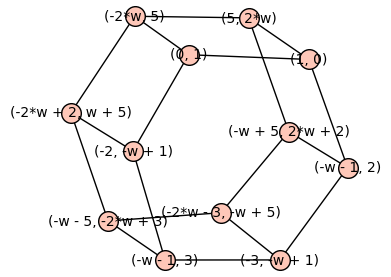

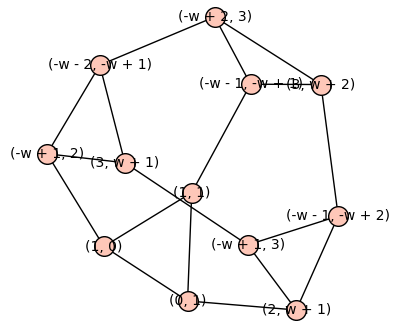

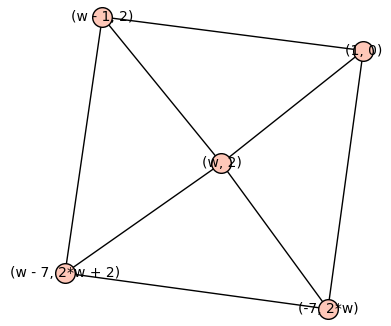

In [6]:
assert len(polys)==4
for G in polys: show(G)

In [7]:
triangles = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==3] for G in polys],[])]
squares = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==4] for G in polys],[])]
hexagons = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==6] for G in polys],[])]
aaa_triangles = [T for T in triangles if is_poly_principal(T)]
aas_triangles = [T for T in triangles if not is_poly_principal(T)]

In [8]:
[len(t) for t in [aaa_triangles, aas_triangles, squares, hexagons]]

[8, 4, 7, 10]

In [9]:
aaa_triangles0 = poly_gl2_orbit_reps(aaa_triangles, alphas)
aas_triangles0 = aas_triangle_gl2_orbit_reps(aas_triangles, alphas)
squares0 = poly_gl2_orbit_reps(squares, alphas)
hexagons0 = poly_gl2_orbit_reps(hexagons, alphas)

In [10]:
[len(t) for t in [aaa_triangles0, aas_triangles0, squares0, hexagons0]]

[1, 2, 2, 1]

In [11]:
[square_parameters(S, alphas, M_alphas, alpha_inv) for S in squares0]

[[[2, 1, 3, 1], [w + 1, 0, -w]], [[0, 2, 0, 3], [0, 0, 0]]]

In [12]:
[aas_triangle_parameters(T, alphas, M_alphas, sigmas) for T in aas_triangles0]

[[[1, 1, 1], 1], [[2, 1, 1], -w]]

In [13]:
triangles1 = [T for T in aaa_triangles0 if not any(poly_equiv(T, t) for t in [tri0(k), tri1(k), tri2(k)])]
triangles1

[]

In [14]:
[aaa_triangle_parameters(T) for T in triangles1]

[]

In [15]:
[hexagon_parameters(H, alphas, M_alphas) for H in hexagons0]

[[[0, 1, 1, 0, 0, 1], [0, -1, 0, 1, 0]]]

In [16]:
S = alphas+alpha_triples(alphas)[1]
Hlist = [(to_k(a),1/a.denominator().norm()) for a in S]
print([a[0] for a in Hlist])

[0, 1/2*w + 1/2, -5/12*w, 5/12*w, 1, -1/2*w + 1/2, -1/2*w - 1/2, 1/2*w - 1/2]


In [17]:
plot_Bianchi_diagram(k,Hlist)

Graphics3d Object